### Visualize the bahaviour of the North component of the Earth magnetic field on 16 June 2012

In [2]:
import pandas as pd
import numpy as np
from pandas.api.types import CategoricalDtype
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import cartopy.crs as ccrs
from datetime import datetime as dt
import string

In [3]:
df = pd.read_csv('data/events/2012-06-16.csv')
df.head()

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
0,2012-06-16 00:00:00,1,AMA,129.33,28.17,8.85,68.86,-3.5,-10.6,-0.6,-4.5,-10.2,-0.6,-2.290594,-1.189035,0.205033,1.913915
1,2012-06-16 00:00:00,1,ASB,142.17,43.46,9.69,53.33,2.5,-0.1,1.5,2.5,-0.5,1.5,-2.248572,-0.385864,0.741660,2.195724
2,2012-06-16 00:00:00,1,BCL,105.71,9.30,7.26,88.59,6.7,3.0,12.9,6.7,3.0,12.9,-2.176271,-0.583293,0.812492,2.355597
3,2012-06-16 00:00:00,1,C01,276.10,42.42,18.73,37.35,-2.0,3.1,6.6,-1.7,3.4,6.6,-0.652744,0.166167,1.233928,3.134557
4,2012-06-16 00:00:00,1,C04,251.74,50.06,16.41,31.86,2.3,0.0,6.4,2.3,0.5,6.4,-0.121875,0.770313,1.735136,3.416930


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5529600 entries, 0 to 5529599
Data columns (total 17 columns):
 #   Column    Dtype  
---  ------    -----  
 0   Date_UTC  object 
 1   Extent    int64  
 2   IAGA      object 
 3   GEOLON    float64
 4   GEOLAT    float64
 5   MLT       float64
 6   MCOLAT    float64
 7   dbn_nez   float64
 8   dbe_nez   float64
 9   dbz_nez   float64
 10  dbn_geo   float64
 11  dbe_geo   float64
 12  dbz_geo   float64
 13  PC2_IPOW  float64
 14  PC3_IPOW  float64
 15  PC4_IPOW  float64
 16  PC5_IPOW  float64
dtypes: float64(14), int64(1), object(2)
memory usage: 717.2+ MB


In [5]:
df['Date_UTC'] = pd.to_datetime(df.Date_UTC)

In [6]:
# available stations
print(df.IAGA.unique())

['AMA' 'ASB' 'BCL' 'C01' 'C04' 'C05' 'C06' 'C10' 'C11' 'C12' 'CAN' 'CY0'
 'DAW' 'DRW' 'FMC' 'FSJ' 'FSP' 'FYU' 'GHC' 'GIM' 'HVD' 'INK' 'ISL' 'KRT'
 'LCL' 'LET' 'LKW' 'M01' 'M04' 'M08' 'MUT' 'NAB' 'NAN' 'ONW' 'PG1' 'PGC'
 'PIN' 'PKR' 'PTK' 'RAL' 'RAN' 'RED' 'T03' 'T23' 'T24' 'T25' 'T29' 'T31'
 'T32' 'T33' 'T35' 'T36' 'T37' 'T38' 'T39' 'T40' 'T41' 'T42' 'T43' 'T56'
 'T58' 'T61' 'TAL' 'TIR']


### T35 station

In [7]:
# station t35 (north - fig. 4a in paper)
t35 = df[df.IAGA == 'T35'].reset_index(drop=True)

t35

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
0,2012-06-16 00:00:00,1,T35,249.1,63.6,15.86,18.9,4.4,-1.5,-13.1,4.6,-0.2,-13.1,0.039548,0.394065,1.599446,3.960093
1,2012-06-16 00:00:01,1,T35,249.1,63.6,15.86,18.9,4.4,-1.5,-13.1,4.6,-0.2,-13.1,0.030640,0.405021,1.600930,3.959195
2,2012-06-16 00:00:02,1,T35,249.1,63.6,15.86,18.9,4.4,-1.4,-13.1,4.6,-0.1,-13.1,0.012714,0.415406,1.602440,3.958296
3,2012-06-16 00:00:03,1,T35,249.1,63.6,15.86,18.9,4.6,-1.5,-13.2,4.9,-0.1,-13.2,-0.014551,0.424998,1.603978,3.957395
4,2012-06-16 00:00:04,1,T35,249.1,63.6,15.86,18.9,4.6,-1.6,-13.2,4.8,-0.2,-13.2,-0.050246,0.433595,1.605540,3.956492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86395,2012-06-16 23:59:55,1,T35,249.1,63.6,15.85,18.9,11.7,-47.7,-107.3,24.8,-42.4,-107.3,-0.140008,2.651577,4.286791,6.173203
86396,2012-06-16 23:59:56,1,T35,249.1,63.6,15.85,18.9,11.7,-47.8,-107.6,24.8,-42.5,-107.6,-0.197195,2.653845,4.285668,6.171722
86397,2012-06-16 23:59:57,1,T35,249.1,63.6,15.85,18.9,11.8,-47.9,-107.8,24.9,-42.6,-107.8,-0.251361,2.656215,4.284591,6.170240
86398,2012-06-16 23:59:58,1,T35,249.1,63.6,15.85,18.9,11.9,-48.0,-108.2,25.0,-42.7,-108.2,-0.297787,2.658674,4.283561,6.168757


In [8]:
t35.head(2)

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
0,2012-06-16 00:00:00,1,T35,249.1,63.6,15.86,18.9,4.4,-1.5,-13.1,4.6,-0.2,-13.1,0.039548,0.394065,1.599446,3.960093
1,2012-06-16 00:00:01,1,T35,249.1,63.6,15.86,18.9,4.4,-1.5,-13.1,4.6,-0.2,-13.1,0.030640,0.405021,1.600930,3.959195


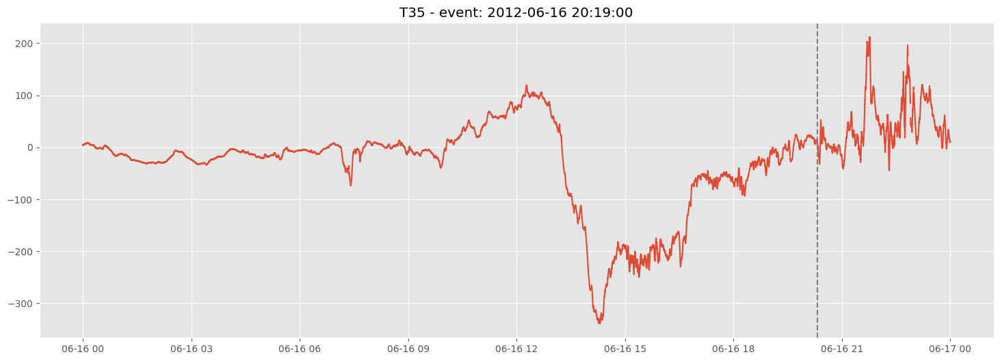

In [9]:
plt.figure(figsize=(18,6))
plt.plot(t35.Date_UTC, t35.dbn_nez)
plt.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed')
plt.title('T35 - event: 2012-06-16 20:19:00')
plt.show()

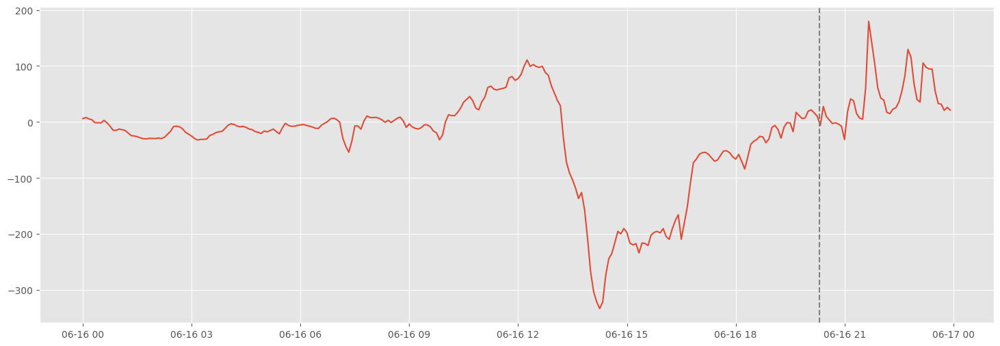

In [10]:
t35_resampled = t35[['Date_UTC', 'dbn_nez']].resample('5Min',on='Date_UTC').mean().reset_index()
plt.figure(figsize=(18,6))
plt.plot(t35_resampled.Date_UTC, t35_resampled.dbn_nez)
plt.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed');

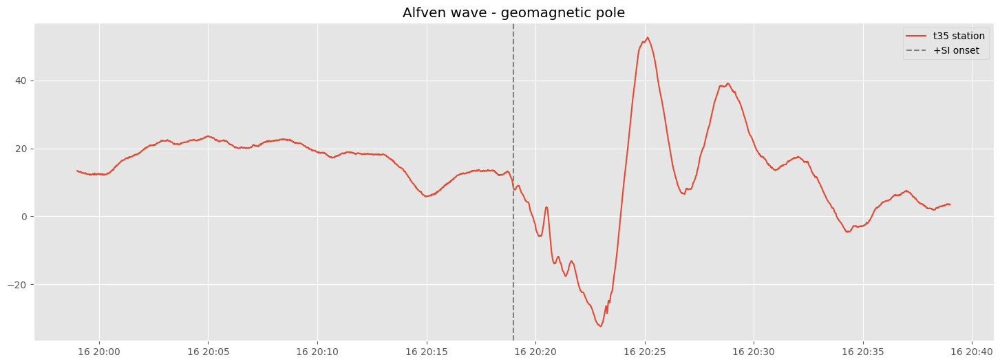

In [11]:
# +SI onset at 20:19 UT on 16 June 2012 
# plus/minus 20 minutes
time_filter = (t35['Date_UTC'] >= pd.Timestamp('2012-06-16 20:19:00') - pd.Timedelta(minutes=20)) & (t35['Date_UTC'] <= pd.Timestamp('2012-06-16 20:19:00') + pd.Timedelta(minutes=20))
filtered_t35 = t35.loc[time_filter].reset_index(drop=True)
# minute granularity
# filtered_t35['Date_UTC'] = filtered_t35['Date_UTC'].apply(lambda t: t.strftime('%Y-%m-%d %H:%M'))
# filtered_t35.groupby('Date_UTC').aggregate({'dbe_nez':'mean'})
# plot
plt.figure(figsize=(18,6))
plt.plot(filtered_t35.Date_UTC, filtered_t35.dbn_nez, label='t35 station')
plt.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed')
plt.title('Alfven wave - geomagnetic pole')
plt.legend();

### T58 station

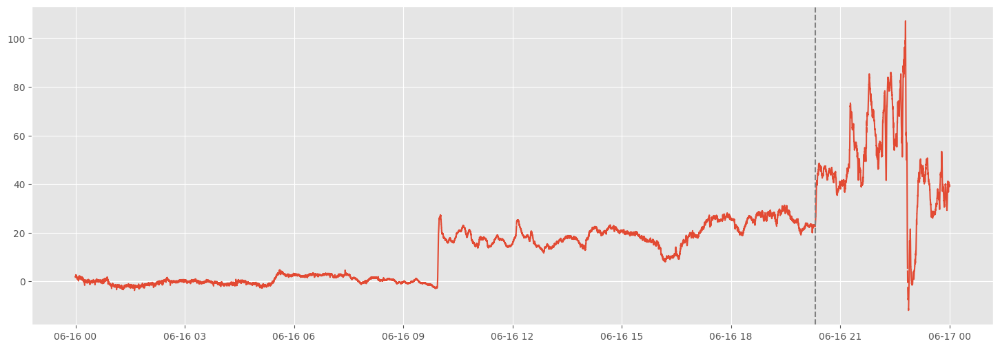

In [12]:
t58 = df[df.IAGA == 'T58'].reset_index(drop=True)

plt.figure(figsize=(18,6))
plt.plot(t58.Date_UTC, t58.dbn_nez)
plt.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed')
plt.show()

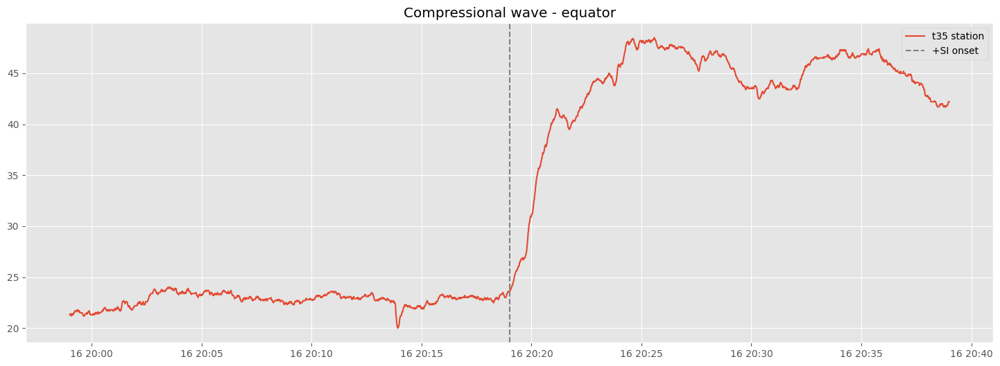

In [13]:
# +SI onset at 20:19 UT on 16 June 2012 
# plus/minus 20 minutes
time_filter = (t58['Date_UTC'] >= pd.Timestamp('2012-06-16 20:19:00') - pd.Timedelta(minutes=20)) & (t58['Date_UTC'] <= pd.Timestamp('2012-06-16 20:19:00') + pd.Timedelta(minutes=20))
filtered_t58 = t58.loc[time_filter].reset_index(drop=True)
# plot
plt.figure(figsize=(18,6))
plt.plot(filtered_t58.Date_UTC, filtered_t58.dbn_nez, label='t35 station')
plt.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed')
plt.title('Compressional wave - equator')
plt.legend();

### More stations (sorted by latitude)

In [14]:
df = df.sort_values(by=['MCOLAT', 'Date_UTC'])
df

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
11,2012-06-16 00:00:00,1,CY0,291.4,70.5,20.63,11.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75,2012-06-16 00:00:01,1,CY0,291.4,70.5,20.63,11.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
139,2012-06-16 00:00:02,1,CY0,291.4,70.5,20.63,11.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
203,2012-06-16 00:00:03,1,CY0,291.4,70.5,20.63,11.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
267,2012-06-16 00:00:04,1,CY0,291.4,70.5,20.63,11.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5529314,2012-06-16 23:59:55,1,PG1,77.2,-85.5,21.61,166.55,21.1,-49.1,29.5,-52.0,-12.5,29.5,0.074338,1.409845,4.106074,5.304385
5529378,2012-06-16 23:59:56,1,PG1,77.2,-85.5,21.61,166.55,21.0,-49.1,29.5,-52.0,-12.3,29.5,0.101791,1.416551,4.104729,5.304645
5529442,2012-06-16 23:59:57,1,PG1,77.2,-85.5,21.61,166.55,21.0,-49.1,29.4,-52.0,-12.3,29.4,0.123191,1.423174,4.103361,5.304913
5529506,2012-06-16 23:59:58,1,PG1,77.2,-85.5,21.61,166.55,20.8,-49.0,29.4,-51.9,-12.2,29.4,0.139319,1.429632,4.101973,5.305187


In [15]:
df.isna().any()

Date_UTC    False
Extent      False
IAGA        False
GEOLON      False
GEOLAT      False
MLT         False
MCOLAT      False
dbn_nez      True
dbe_nez      True
dbz_nez      True
dbn_geo      True
dbe_geo      True
dbz_geo      True
PC2_IPOW     True
PC3_IPOW     True
PC4_IPOW     True
PC5_IPOW     True
dtype: bool

In [16]:
df = df.dropna(subset='dbn_nez').reset_index(drop=True)
# filter
# 20:19 UT on 16 June 2012, plus/minus 20 minutes
time_filter = (df['Date_UTC'] >= pd.Timestamp('2012-06-16 20:19:00') - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= pd.Timestamp('2012-06-16 20:19:00') + pd.Timedelta(minutes=20))
filtered_df = df.loc[time_filter].reset_index(drop=True)
filtered_df

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
0,2012-06-16 19:59:00,1,CY0,291.4,70.5,16.71,11.48,31.8,53.4,8.9,58.6,20.6,8.9,-0.518698,1.417139,3.179118,5.308453
1,2012-06-16 19:59:01,1,CY0,291.4,70.5,16.71,11.48,31.9,53.0,9.1,58.5,20.3,9.1,-0.492173,1.425554,3.178294,5.308867
2,2012-06-16 19:59:02,1,CY0,291.4,70.5,16.71,11.48,31.9,52.7,9.2,58.3,20.1,9.2,-0.463561,1.434568,3.177456,5.309289
3,2012-06-16 19:59:03,1,CY0,291.4,70.5,16.71,11.48,32.0,52.3,9.4,58.1,19.7,9.4,-0.434245,1.444100,3.176604,5.309720
4,2012-06-16 19:59:04,1,CY0,291.4,70.5,16.71,11.48,32.0,51.9,9.5,57.8,19.4,9.5,-0.405561,1.454065,3.175738,5.310158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150647,2012-06-16 20:38:56,1,PG1,77.2,-85.5,18.36,166.55,-12.7,-41.7,64.7,-39.0,19.6,64.7,-0.741055,0.866557,3.297741,5.281209
150648,2012-06-16 20:38:57,1,PG1,77.2,-85.5,18.36,166.55,-12.7,-41.6,64.7,-38.8,19.6,64.7,-0.793328,0.873332,3.304087,5.281527
150649,2012-06-16 20:38:58,1,PG1,77.2,-85.5,18.36,166.55,-12.6,-41.5,64.7,-38.7,19.4,64.7,-0.844015,0.880471,3.310394,5.281855
150650,2012-06-16 20:38:59,1,PG1,77.2,-85.5,18.36,166.55,-12.6,-41.3,64.7,-38.6,19.5,64.7,-0.890550,0.887963,3.316661,5.282193


In [17]:
filtered_df.IAGA.nunique()

63

In [18]:
# stations of interest
stations = ['T35', 'FSP', 'FMC', 'FSJ', 'T36', 'C06', 'LCL', 'RED', 'T37', 'C04', 'T43', 'T03', 'LET', 'T25', 'T58']
filtered_df = filtered_df[filtered_df.IAGA.isin(stations)].reset_index(drop=True)

In [19]:
filtered_df

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
0,2012-06-16 19:59:00,1,T35,249.10,63.60,11.94,18.90,13.4,-13.9,-20.0,16.8,-9.5,-20.0,0.203958,1.463693,2.922847,5.307982
1,2012-06-16 19:59:01,1,T35,249.10,63.60,11.94,18.90,13.4,-13.8,-20.1,16.8,-9.4,-20.1,0.213840,1.459531,2.922633,5.306502
2,2012-06-16 19:59:02,1,T35,249.10,63.60,11.94,18.90,13.2,-13.7,-20.2,16.5,-9.4,-20.2,0.214745,1.455172,2.922449,5.305022
3,2012-06-16 19:59:03,1,T35,249.10,63.60,11.94,18.90,13.2,-13.7,-20.1,16.6,-9.4,-20.1,0.207437,1.450586,2.922294,5.303542
4,2012-06-16 19:59:04,1,T35,249.10,63.60,11.94,18.90,13.1,-13.9,-20.2,16.5,-9.6,-20.2,0.193282,1.445751,2.922170,5.302063
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35979,2012-06-16 20:38:56,1,T58,237.83,37.42,12.28,47.51,41.9,-45.3,3.3,51.7,-33.8,3.3,-0.471600,1.247814,2.476919,4.427366
35980,2012-06-16 20:38:57,1,T58,237.83,37.42,12.28,47.51,42.1,-45.1,3.2,51.8,-33.6,3.2,-0.470069,1.245170,2.475887,4.427057
35981,2012-06-16 20:38:58,1,T58,237.83,37.42,12.28,47.51,42.2,-45.3,3.3,51.9,-33.8,3.3,-0.458888,1.242469,2.474826,4.426747
35982,2012-06-16 20:38:59,1,T58,237.83,37.42,12.28,47.51,42.2,-45.4,3.1,51.9,-33.8,3.1,-0.436530,1.239696,2.473735,4.426436


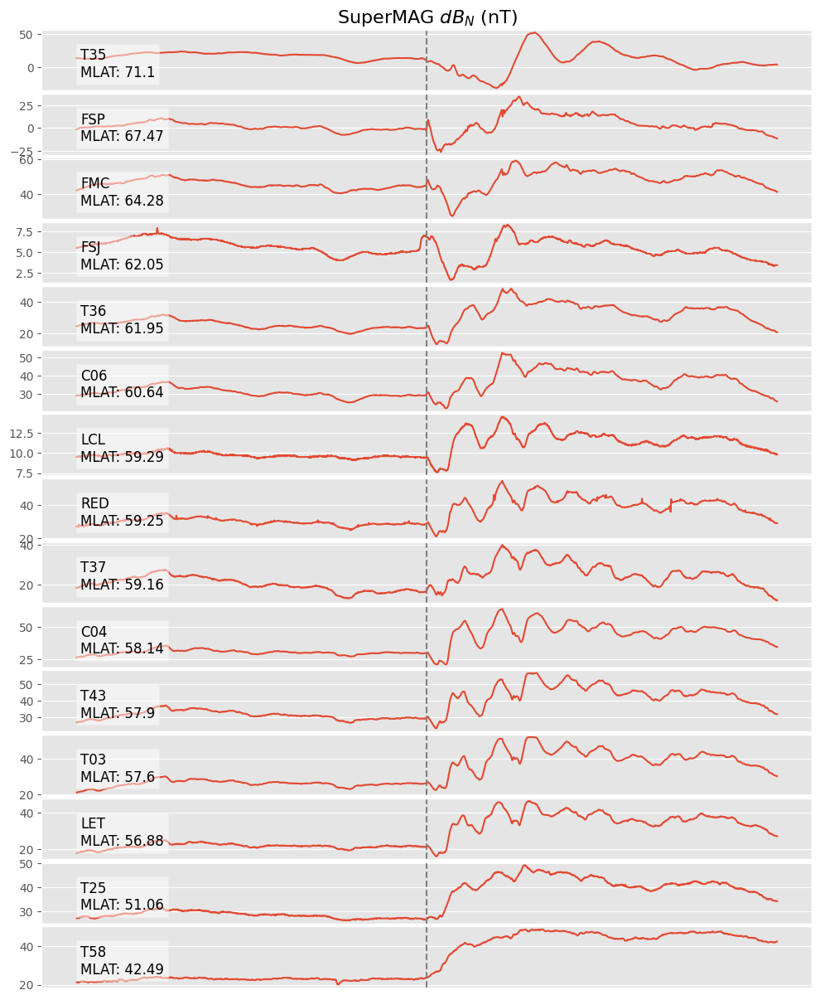

In [20]:
num_rows = filtered_df.IAGA.nunique() 
fig, axs = plt.subplots(num_rows, 1, figsize=(12, num_rows))


for i, station in enumerate(filtered_df.IAGA.unique()):
    ax = axs[i]
    single_station_df = filtered_df[filtered_df.IAGA == station]
    ax.plot(single_station_df.Date_UTC, single_station_df.dbn_nez, label=station)
    ax.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed')
    ax.text(0.05, 0.7, station + '\nMLAT: '+ str(90-filtered_df[(filtered_df.IAGA==station)&(filtered_df.Date_UTC==pd.Timestamp('2012-06-16 20:19:00'))].MCOLAT.item()), 
            transform=ax.transAxes, fontsize=12, va='top', bbox=dict(facecolor='white', boxstyle='square', alpha=0.5))
    ax.set_xticks([])
    ax.set_xticklabels([])

plt.subplots_adjust(hspace=0.05)
axs[0].set_title(r'SuperMAG $dB_N$ (nT)', fontsize=16)
plt.show()

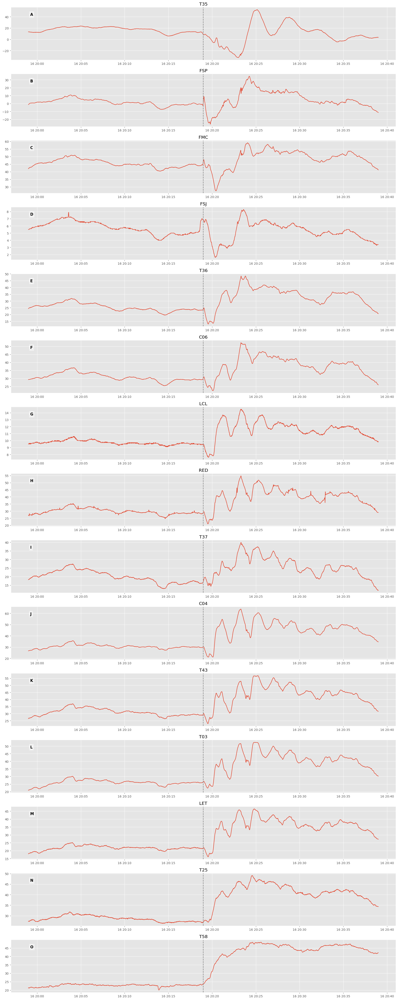

In [21]:
num_rows = filtered_df.IAGA.nunique() 
fig, axs = plt.subplots(num_rows, 1, figsize=(18, 3*num_rows))

alphabetic_order = string.ascii_uppercase

for i, station in enumerate(filtered_df.IAGA.unique()):
    ax = axs[i]
    single_station_df = filtered_df[filtered_df.IAGA == station]
    ax.plot(single_station_df.Date_UTC, single_station_df.dbn_nez, label=station)
    ax.axvline(pd.Timestamp('2012-06-16 20:19:00'), label='+SI onset', color='gray', linestyle='dashed')
    ax.text(0.05, 0.9, alphabetic_order[i], transform=ax.transAxes, fontsize=12, fontweight='bold', va='top', bbox=dict(facecolor='white', boxstyle='square', alpha=0.5))
    ax.set_title(station)
    
plt.tight_layout()

plt.show()


### Other two events on 16 June 2012 (at 09.55 and at 21.15)

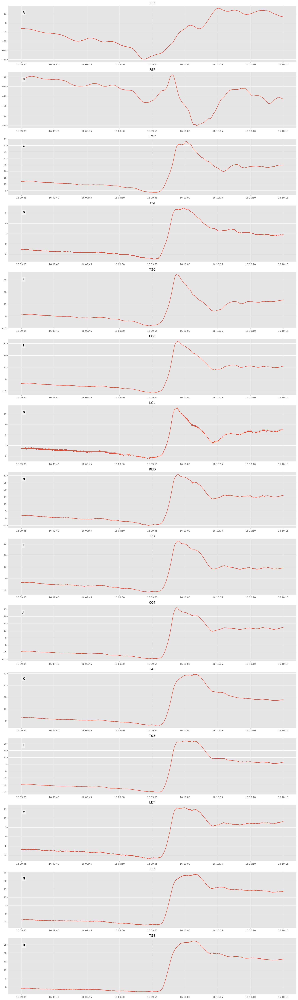

In [22]:
def stations_signals(df, time_stamp, stations_of_interest):
    # filter data
    time_filter = (df['Date_UTC'] >= time_stamp - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= time_stamp + pd.Timedelta(minutes=20))
    filtered_df = df.loc[time_filter].reset_index(drop=True)

    filtered_df = filtered_df[filtered_df.IAGA.isin(stations_of_interest)].reset_index(drop=True)

    num_rows = filtered_df.IAGA.nunique() 

    # produce plot
    fig, axs = plt.subplots(num_rows, 1, figsize=(18, 4*num_rows))

    alphabetic_order = string.ascii_uppercase

    for i, station in enumerate(filtered_df.IAGA.unique()):
        ax = axs[i]
        single_station_df = filtered_df[filtered_df.IAGA == station]
        ax.plot(single_station_df.Date_UTC, single_station_df.dbn_nez, label=station)
        ax.axvline(time_stamp, label='+SI onset', color='gray', linestyle='dashed')
        ax.text(0.05, 0.9, alphabetic_order[i], transform=ax.transAxes, fontsize=12, fontweight='bold', va='top', bbox=dict(facecolor='white', boxstyle='square', alpha=0.5))
        ax.set_title(station)
        
    plt.tight_layout()

    plt.show()

# event around 9.55 +/- 20 min
stations_signals(df, time_stamp = pd.Timestamp('2012-06-16 9:55:00'), stations_of_interest = stations)

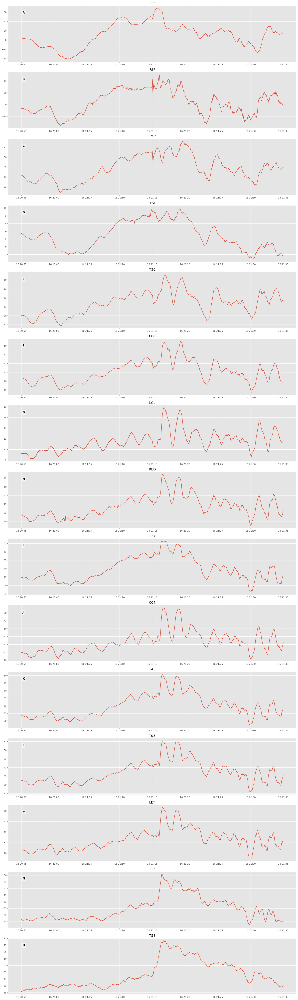

In [23]:
# event around 21.15 +/- 20 min
stations_signals(df, time_stamp = pd.Timestamp('2012-06-16 21:15:00'), stations_of_interest = stations)

### Plotting PC waves around 2012-06-16 20:19:00

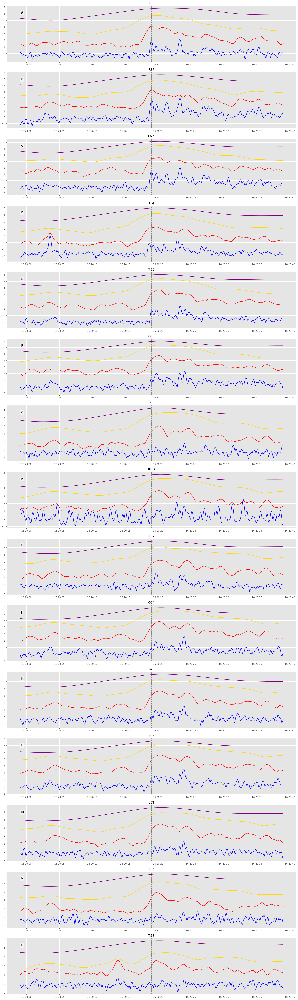

In [24]:
t = pd.Timestamp('2012-06-16 20:19:00')

time_filter = (df['Date_UTC'] >= t - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= t + pd.Timedelta(minutes=20))
filtered_df = df.loc[time_filter].reset_index(drop=True)

filtered_df = filtered_df[filtered_df.IAGA.isin(stations)].reset_index(drop=True)

# plot

num_rows = filtered_df.IAGA.nunique() 

fig, axs = plt.subplots(num_rows, 1, figsize=(18, 4*num_rows))

alphabetic_order = string.ascii_uppercase

for i, station in enumerate(filtered_df.IAGA.unique()):
    ax = axs[i]
    single_station_df = filtered_df[filtered_df.IAGA == station]
    ax.plot(single_station_df.Date_UTC, single_station_df.PC2_IPOW, label=station, color='blue')
    ax.plot(single_station_df.Date_UTC, single_station_df.PC3_IPOW, label=station, color='red')
    ax.plot(single_station_df.Date_UTC, single_station_df.PC4_IPOW, label=station, color='gold')
    ax.plot(single_station_df.Date_UTC, single_station_df.PC5_IPOW, label=station, color='purple')
    ax.axvline(t, label='+SI onset', color='gray', linestyle='dashed')
    ax.text(0.05, 0.9, alphabetic_order[i], transform=ax.transAxes, fontsize=12, fontweight='bold', va='top', bbox=dict(facecolor='white', boxstyle='square', alpha=0.5))
    ax.set_title(station)
        
plt.tight_layout()

plt.show()

### Visualizing PC waves for the other two events

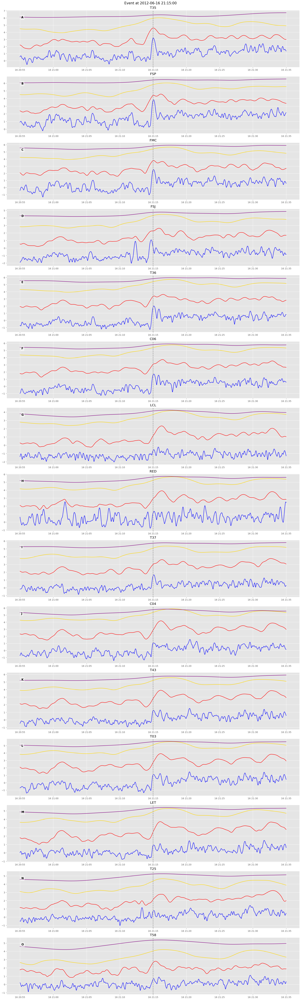

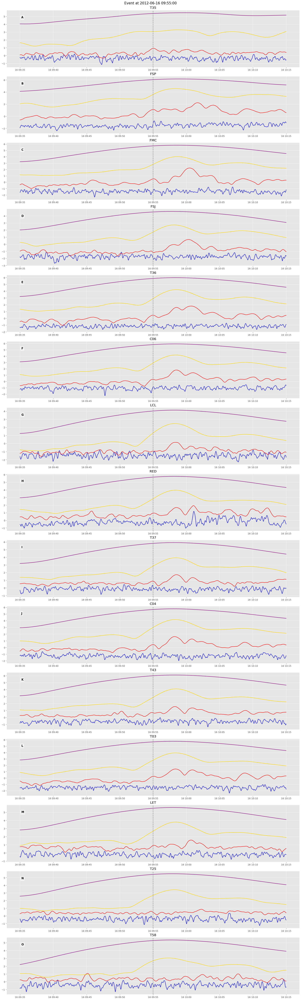

In [25]:
### Other two events on 16 June 2012, at 09.55 and at 21.15
events = [pd.Timestamp('2012-06-16 21:15:00'), pd.Timestamp('2012-06-16 9:55:00')]

for t in events:
    time_filter = (df['Date_UTC'] >= t - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= t + pd.Timedelta(minutes=20))
    filtered_df = df.loc[time_filter].reset_index(drop=True)

    filtered_df = filtered_df[filtered_df.IAGA.isin(stations)].reset_index(drop=True)

    # plot

    num_rows = filtered_df.IAGA.nunique() 

    fig, axs = plt.subplots(num_rows, 1, figsize=(18, 4*num_rows), layout='constrained')

    fig.suptitle('Event at '+str(t), size=15)

    alphabetic_order = string.ascii_uppercase

    for i, station in enumerate(filtered_df.IAGA.unique()):
        ax = axs[i]
        single_station_df = filtered_df[filtered_df.IAGA == station]
        ax.plot(single_station_df.Date_UTC, single_station_df.PC2_IPOW, label=station, color='blue')
        ax.plot(single_station_df.Date_UTC, single_station_df.PC3_IPOW, label=station, color='red')
        ax.plot(single_station_df.Date_UTC, single_station_df.PC4_IPOW, label=station, color='gold')
        ax.plot(single_station_df.Date_UTC, single_station_df.PC5_IPOW, label=station, color='purple')
        ax.axvline(t, label='+SI onset', color='gray', linestyle='dashed')
        ax.text(0.05, 0.9, alphabetic_order[i], transform=ax.transAxes, fontsize=12, fontweight='bold', va='top', bbox=dict(facecolor='white', boxstyle='square', alpha=0.5))
        ax.set_title(station)
            
    plt.show()

### Heatmap

In [26]:
t = pd.Timestamp('2012-06-16 20:19:00') # select 20 min before and after this event
time_filter = (df['Date_UTC'] >= pd.Timestamp('2012-06-16 20:19:00') - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= pd.Timestamp('2012-06-16 20:19:00') + pd.Timedelta(minutes=20))
filtered_df = df.loc[time_filter].reset_index(drop=True)
filtered_df = filtered_df[filtered_df.IAGA.isin(stations)].reset_index(drop=True)

filtered_df.pivot_table(index='IAGA', columns='Date_UTC', values='dbn_nez')

Date_UTC,2012-06-16 19:59:00,2012-06-16 19:59:01,2012-06-16 19:59:02,2012-06-16 19:59:03,2012-06-16 19:59:04,2012-06-16 19:59:05,2012-06-16 19:59:06,2012-06-16 19:59:07,2012-06-16 19:59:08,2012-06-16 19:59:09,...,2012-06-16 20:38:51,2012-06-16 20:38:52,2012-06-16 20:38:53,2012-06-16 20:38:54,2012-06-16 20:38:55,2012-06-16 20:38:56,2012-06-16 20:38:57,2012-06-16 20:38:58,2012-06-16 20:38:59,2012-06-16 20:39:00
IAGA,,,,,,,,,,,,,,,,,,,,,
C04,26.6,26.7,26.7,26.8,26.8,26.8,26.9,26.9,26.9,27.0,...,35.3,35.2,35.1,35.0,34.9,34.9,34.8,34.7,34.7,34.6
C06,29.3,29.3,29.3,29.3,29.4,29.4,29.4,29.4,29.4,29.4,...,26.9,26.7,26.6,26.5,26.4,26.3,26.2,26.2,26.1,26.0
FMC,42.0,42.2,42.3,42.3,42.4,42.5,42.5,42.6,42.6,42.7,...,41.9,41.9,41.8,41.9,41.7,41.7,41.5,41.5,41.3,41.2
FSJ,5.5,5.5,5.5,5.5,5.5,5.5,5.5,5.6,5.6,5.6,...,3.3,3.4,3.4,3.4,3.4,3.4,3.4,3.4,3.4,3.4
FSP,-1.3,-1.2,-1.0,-0.8,-0.7,-0.5,-0.4,-0.2,0.0,0.1,...,-10.5,-10.6,-10.6,-10.6,-10.7,-10.8,-10.9,-11.0,-11.2,-11.4
LCL,9.5,9.5,9.5,9.5,9.6,9.5,9.6,9.6,9.5,9.6,...,9.9,9.9,9.9,9.9,9.9,9.8,9.8,9.9,9.8,9.8
LET,18.0,18.2,18.2,18.2,18.3,18.3,18.3,18.4,18.4,18.4,...,27.5,27.5,27.5,27.5,27.4,27.4,27.4,27.4,27.3,27.2
RED,27.0,27.0,27.1,27.1,26.9,26.6,27.4,28.2,27.6,27.4,...,29.4,29.3,29.1,29.1,29.1,29.0,29.0,29.0,29.0,29.0
T03,20.9,21.0,21.0,21.1,21.1,21.1,21.2,21.2,21.2,21.3,...,30.6,30.6,30.6,30.5,30.5,30.4,30.4,30.3,30.3,30.2


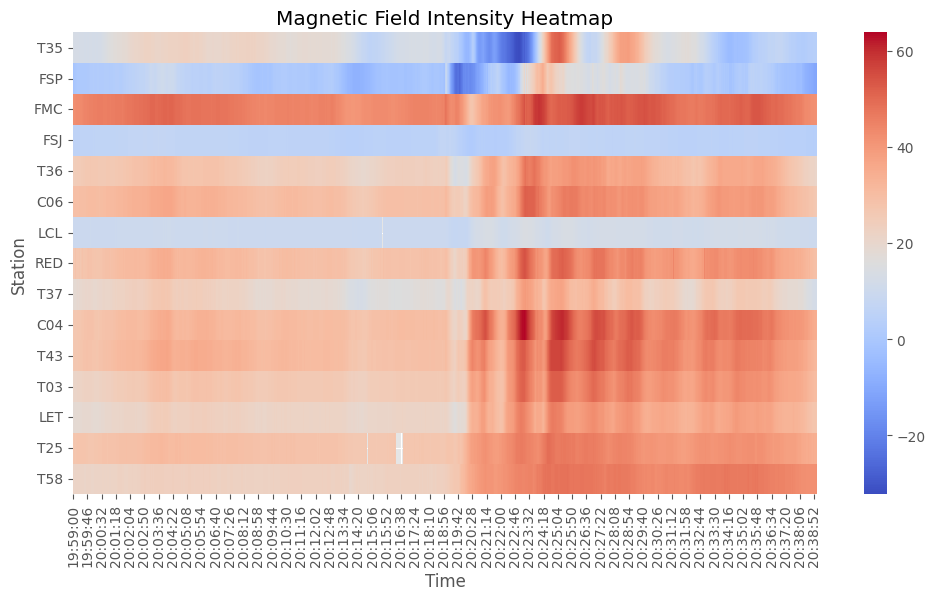

In [27]:
filtered_df['Time'] = pd.to_datetime(filtered_df.Date_UTC).dt.time
pivot_table = filtered_df.pivot_table(index='IAGA', columns='Time', values='dbn_nez')

# sort stations by lat
stations_by_lat = CategoricalDtype(stations, ordered=True)
pivot_table.index = pivot_table.index.astype(stations_by_lat) # convert type 
pivot_table.sort_index(inplace=True) 

plt.figure(figsize=(12, 6))  
sns.heatmap(pivot_table, cmap='coolwarm', cbar=True)

plt.xlabel('Time')
plt.ylabel('Station')
plt.yticks(rotation=0)
plt.title('Magnetic Field Intensity Heatmap')

plt.show()

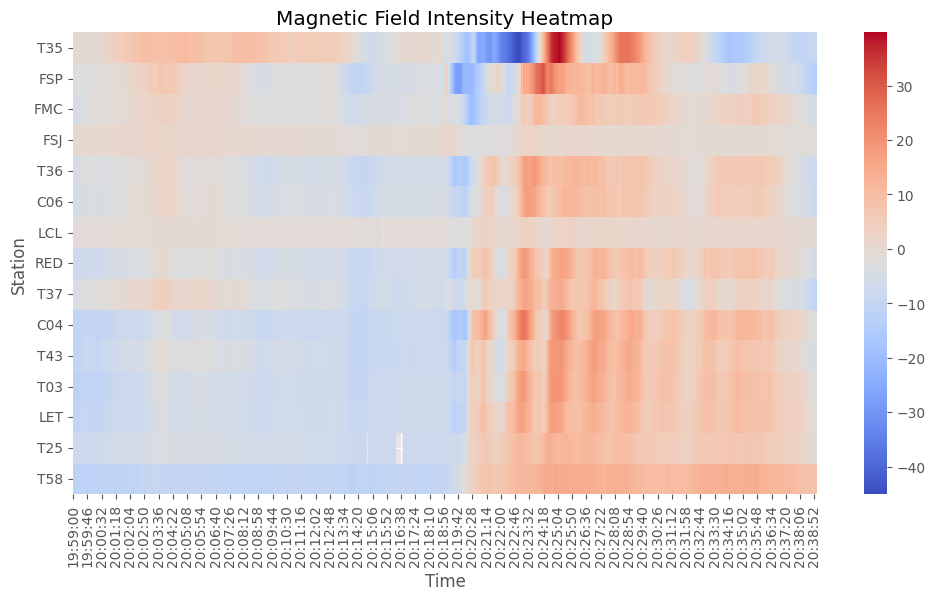

In [28]:
# SAME EVENT HEATMAP BUT NORMALIZED BY ROW

filtered_df['Time'] = pd.to_datetime(filtered_df.Date_UTC).dt.time
pivot_table = filtered_df.pivot_table(index='IAGA', columns='Time', values='dbn_nez')

# sort stations by lat
stations_by_lat = CategoricalDtype(stations, ordered=True)
pivot_table.index = pivot_table.index.astype(stations_by_lat) # convert type 
pivot_table.sort_index(inplace=True) 


# find baseline and artificially subtract that value (avg of dbn_nez) to center colorbar around 0

# calculate the mean of each row
row_means = pivot_table.mean(axis=1)

# subtract the row means from the data
normalized_data = pivot_table.sub(row_means, axis=0)


plt.figure(figsize=(12, 6))  
sns.heatmap(normalized_data, cmap='coolwarm', cbar=True)

plt.xlabel('Time')
plt.ylabel('Station')
plt.yticks(rotation=0)
plt.title('Magnetic Field Intensity Heatmap')

plt.show()

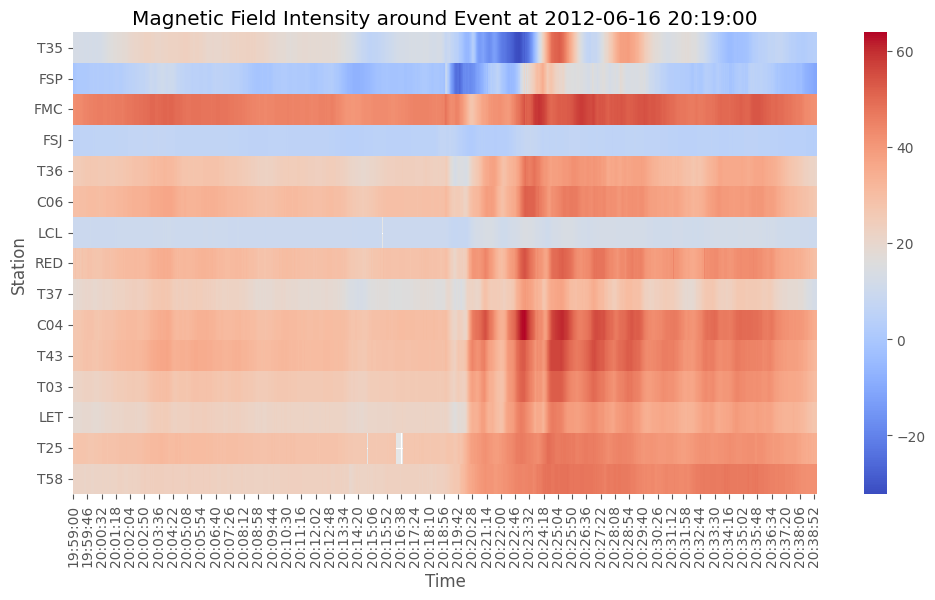

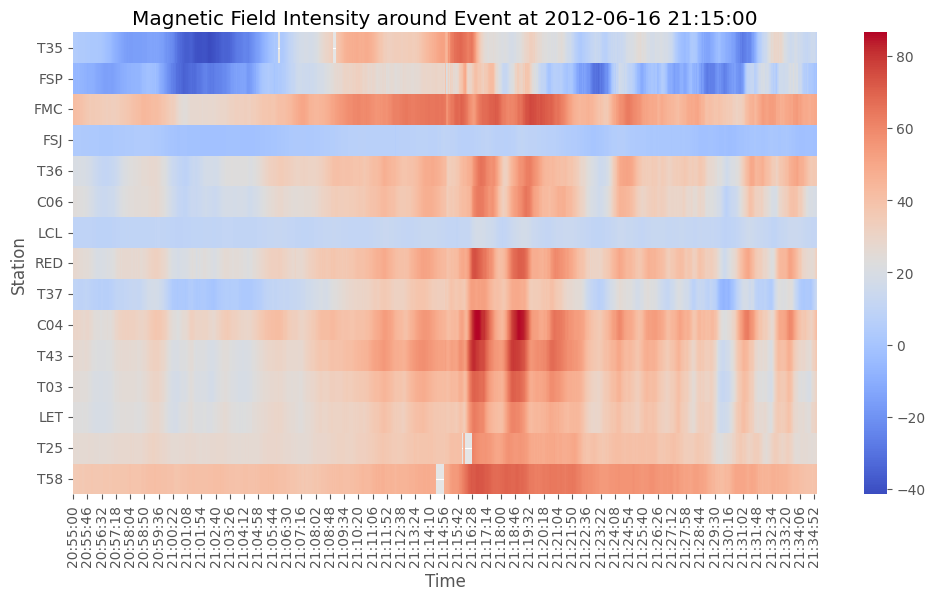

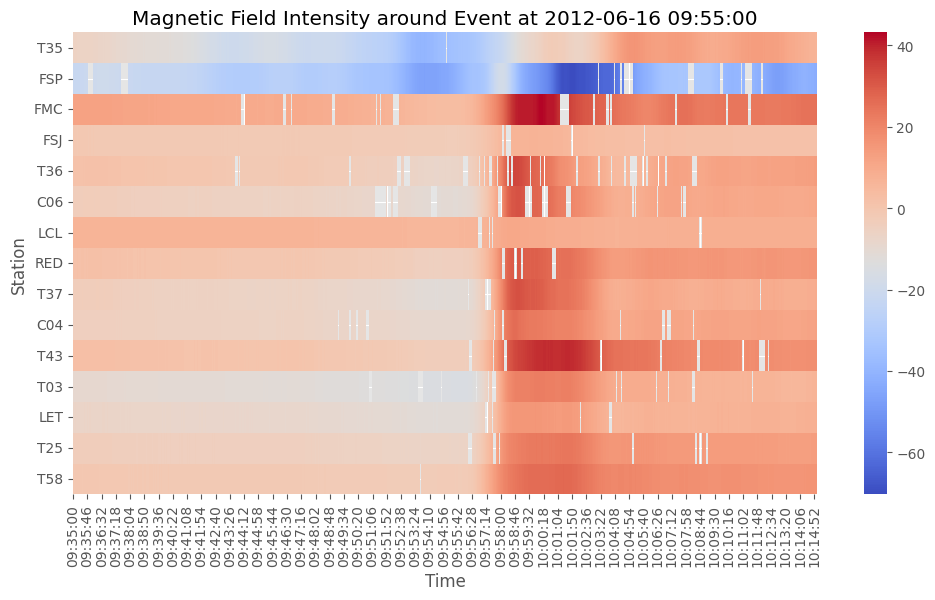

In [29]:
def heatmap_around_event(df, t):
    time_filter = (df['Date_UTC'] >= t - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= t + pd.Timedelta(minutes=20))
    filtered_df = df.loc[time_filter].reset_index(drop=True)
    filtered_df = filtered_df[filtered_df.IAGA.isin(stations)].reset_index(drop=True)

    filtered_df['Time'] = pd.to_datetime(filtered_df.Date_UTC).dt.time
    pivot_table = filtered_df.pivot_table(index='IAGA', columns='Time', values='dbn_nez')

    # sort stations by lat
    stations_by_lat = CategoricalDtype(stations, ordered=True)
    pivot_table.index = pivot_table.index.astype(stations_by_lat) # convert type 
    pivot_table.sort_index(inplace=True) 

    plt.figure(figsize=(12, 6))  
    sns.heatmap(pivot_table, cmap='coolwarm', cbar=True)

    plt.xlabel('Time')
    plt.ylabel('Station')
    plt.yticks(rotation=0)
    plt.title('Magnetic Field Intensity around Event at ' + str(t))

    plt.show()


events = [pd.Timestamp('2012-06-16 20:19:00'), pd.Timestamp('2012-06-16 21:15:00'), pd.Timestamp('2012-06-16 9:55:00')]
for e in events:
    heatmap_around_event(df, e)

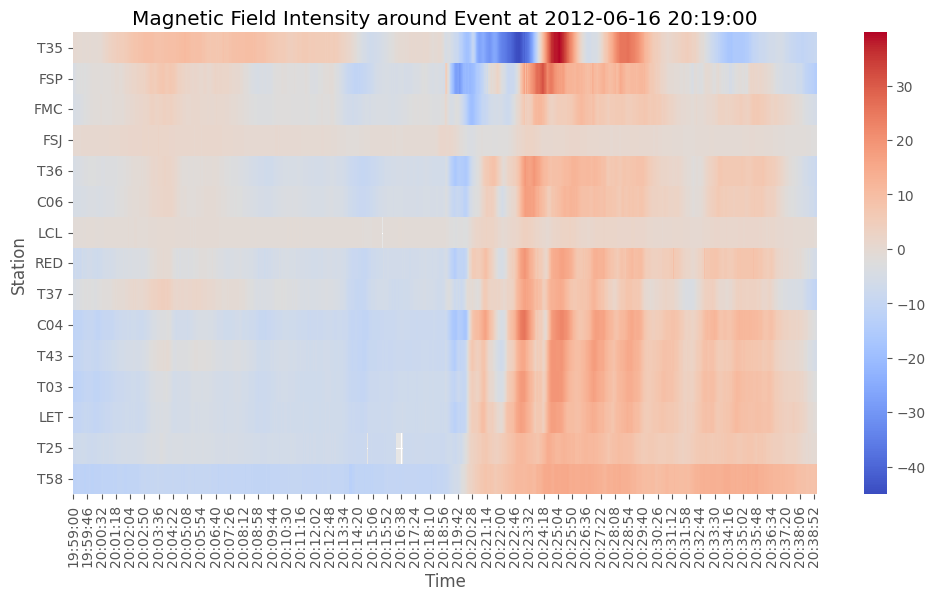

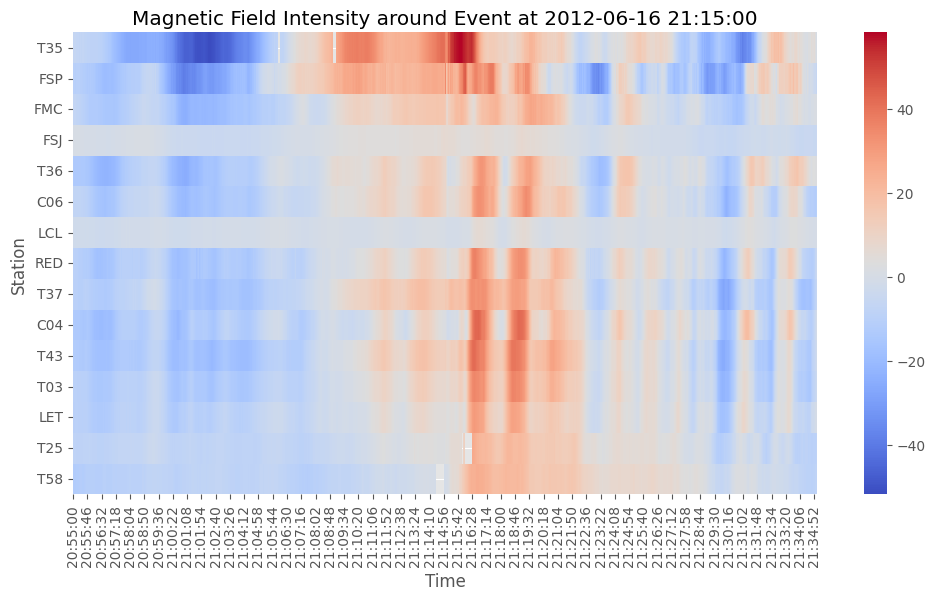

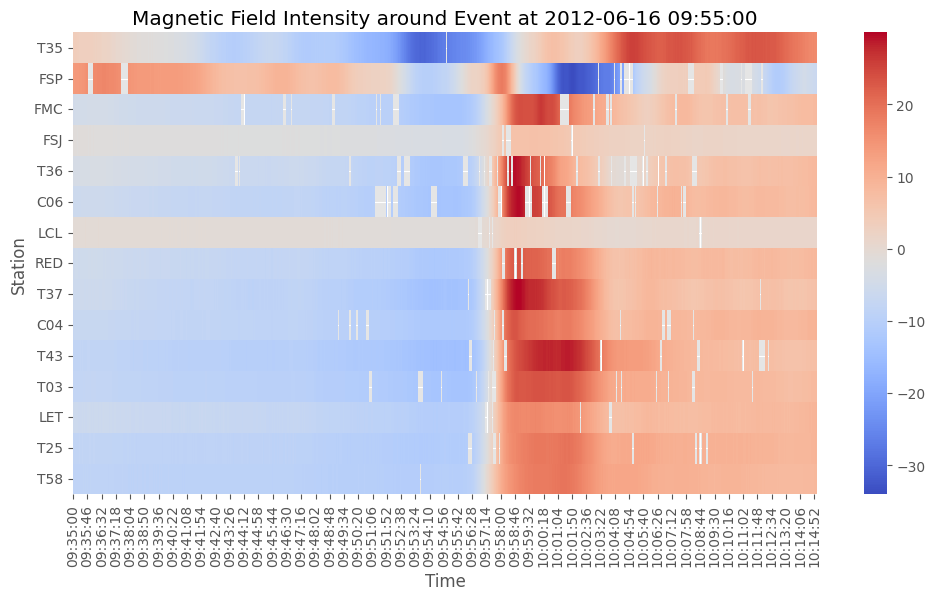

In [30]:
def heatmap_around_event_normalized(df, t):
    time_filter = (df['Date_UTC'] >= t - pd.Timedelta(minutes=20)) & (df['Date_UTC'] <= t + pd.Timedelta(minutes=20))
    filtered_df = df.loc[time_filter].reset_index(drop=True)
    filtered_df = filtered_df[filtered_df.IAGA.isin(stations)].reset_index(drop=True)

    filtered_df['Time'] = pd.to_datetime(filtered_df.Date_UTC).dt.time
    pivot_table = filtered_df.pivot_table(index='IAGA', columns='Time', values='dbn_nez')

    # sort stations by lat
    stations_by_lat = CategoricalDtype(stations, ordered=True)
    pivot_table.index = pivot_table.index.astype(stations_by_lat) # convert type 
    pivot_table.sort_index(inplace=True) 


    # find baseline and artificially subtract that value (avg of dbn_nez) to center colorbar around 0

    # calculate the mean of each row
    row_means = pivot_table.mean(axis=1)

    # subtract the row means from the data
    normalized_data = pivot_table.sub(row_means, axis=0)


    plt.figure(figsize=(12, 6))  
    sns.heatmap(normalized_data, cmap='coolwarm', cbar=True)

    plt.xlabel('Time')
    plt.ylabel('Station')
    plt.yticks(rotation=0)
    plt.title('Magnetic Field Intensity around Event at ' + str(t))

    plt.show()


events = [pd.Timestamp('2012-06-16 20:19:00'), pd.Timestamp('2012-06-16 21:15:00'), pd.Timestamp('2012-06-16 9:55:00')]
for e in events:
    heatmap_around_event_normalized(df, e)

### T35 focus

In [31]:
# represent full day (all df data) - but filter stantion 
# stats_df = df[df.IAGA.isin(stations)].reset_index(drop=True)
T35_df = df[df.IAGA == 'T35'].reset_index(drop=True)
T35_df

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW
0,2012-06-16 00:00:00,1,T35,249.1,63.6,15.86,18.9,4.4,-1.5,-13.1,4.6,-0.2,-13.1,0.039548,0.394065,1.599446,3.960093
1,2012-06-16 00:00:01,1,T35,249.1,63.6,15.86,18.9,4.4,-1.5,-13.1,4.6,-0.2,-13.1,0.030640,0.405021,1.600930,3.959195
2,2012-06-16 00:00:02,1,T35,249.1,63.6,15.86,18.9,4.4,-1.4,-13.1,4.6,-0.1,-13.1,0.012714,0.415406,1.602440,3.958296
3,2012-06-16 00:00:03,1,T35,249.1,63.6,15.86,18.9,4.6,-1.5,-13.2,4.9,-0.1,-13.2,-0.014551,0.424998,1.603978,3.957395
4,2012-06-16 00:00:04,1,T35,249.1,63.6,15.86,18.9,4.6,-1.6,-13.2,4.8,-0.2,-13.2,-0.050246,0.433595,1.605540,3.956492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86083,2012-06-16 23:59:55,1,T35,249.1,63.6,15.85,18.9,11.7,-47.7,-107.3,24.8,-42.4,-107.3,-0.140008,2.651577,4.286791,6.173203
86084,2012-06-16 23:59:56,1,T35,249.1,63.6,15.85,18.9,11.7,-47.8,-107.6,24.8,-42.5,-107.6,-0.197195,2.653845,4.285668,6.171722
86085,2012-06-16 23:59:57,1,T35,249.1,63.6,15.85,18.9,11.8,-47.9,-107.8,24.9,-42.6,-107.8,-0.251361,2.656215,4.284591,6.170240
86086,2012-06-16 23:59:58,1,T35,249.1,63.6,15.85,18.9,11.9,-48.0,-108.2,25.0,-42.7,-108.2,-0.297787,2.658674,4.283561,6.168757


In [32]:
T35_df['event'] = T35_df.Date_UTC.isin(events)

In [33]:
T35_df[T35_df.event==True]

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW,event
35622,2012-06-16 09:55:00,1,T35,249.1,63.6,1.58,18.9,-36.0,-4.7,-12.1,-33.2,-14.7,-12.1,-0.187675,0.943817,3.062276,5.387907,True
72920,2012-06-16 20:19:00,1,T35,249.1,63.6,12.28,18.9,8.3,-29.9,-52.0,16.4,-26.3,-52.0,1.937613,4.134755,5.683573,6.775726,True
76265,2012-06-16 21:15:00,1,T35,249.1,63.6,13.20,18.9,47.1,24.7,-16.3,38.2,37.1,-16.3,3.177165,4.597869,5.964844,6.422493,True


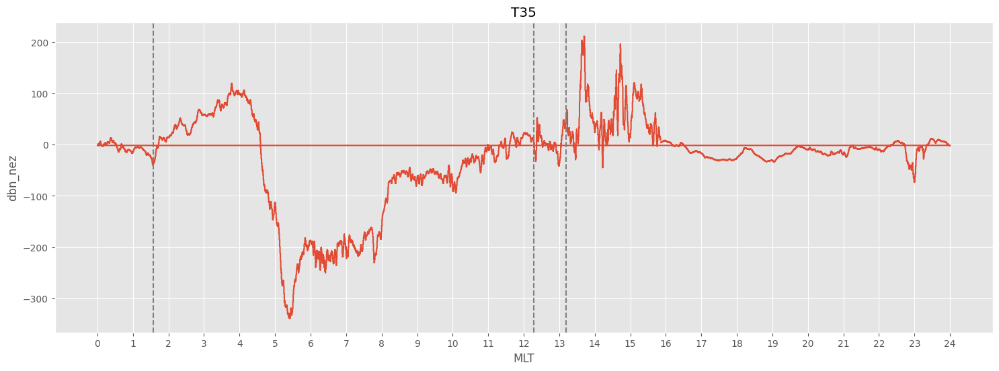

In [34]:
plt.figure(figsize=(18,6))

plt.plot(T35_df.MLT, T35_df.dbn_nez) 
for e in T35_df[T35_df.event==True].MLT.unique():
    plt.axvline(e, label='+SI onset', color='gray', linestyle='dashed')

plt.ylabel('dbn_nez')
plt.xlabel('MLT')
plt.xticks(range(0,25,1))
plt.title('T35')

plt.show()

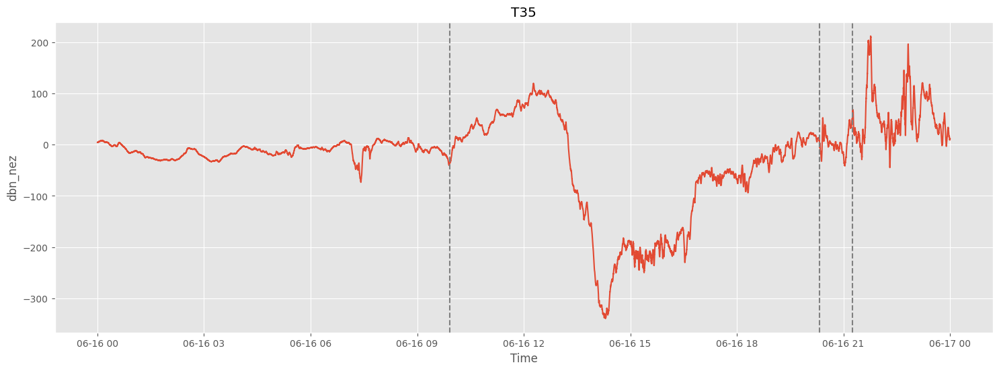

In [35]:
plt.figure(figsize=(18,6))
plt.plot(T35_df.Date_UTC, T35_df.dbn_nez)
for e in T35_df[T35_df.event==True].Date_UTC.unique():
    plt.axvline(e, label='+SI onset', color='gray', linestyle='dashed')
plt.ylabel('dbn_nez')
plt.xlabel('Time')
plt.title('T35')
plt.show()

In [36]:
events

[Timestamp('2012-06-16 20:19:00'),
 Timestamp('2012-06-16 21:15:00'),
 Timestamp('2012-06-16 09:55:00')]

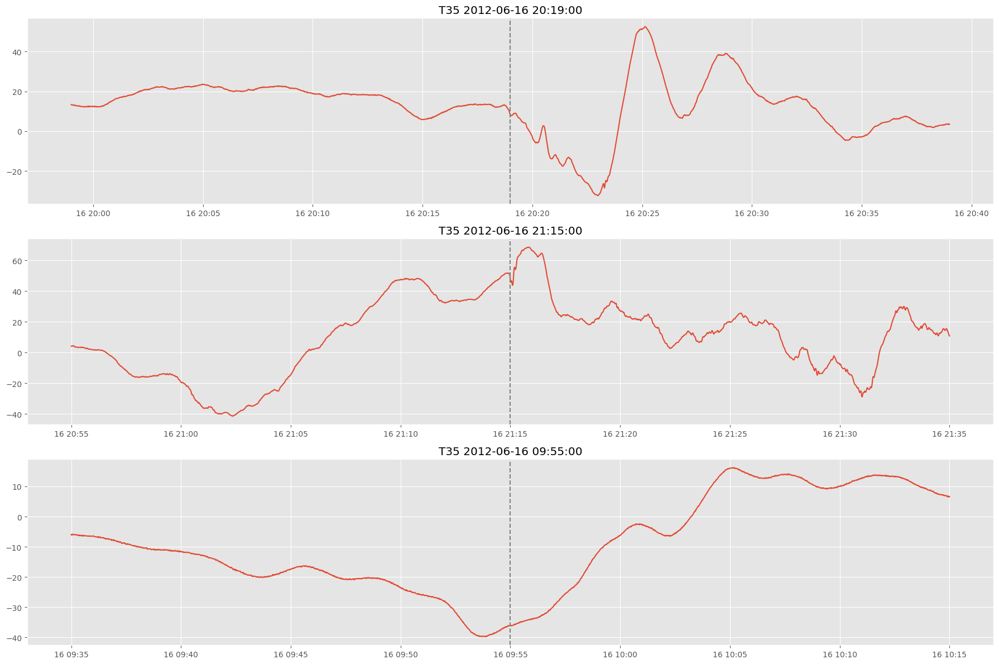

In [37]:
# the 3 events in stations T35 (pole)
# appear very different cause in different local time (exposure to the sun)
# focus on local time 11.30-12.30 (first event)

fig, axs = plt.subplots(len(events), 1, figsize=(18, 4*len(events)))

for i, event in enumerate(events):
    ax = axs[i]
    time_filter = (T35_df['Date_UTC'] >= event - pd.Timedelta(minutes=20)) & (T35_df['Date_UTC'] <= event + pd.Timedelta(minutes=20))
    filtered_t35 = T35_df.loc[time_filter].reset_index(drop=True)

    ax.plot(filtered_t35.Date_UTC, filtered_t35.dbn_nez, label=station)
    ax.axvline(event, label='+SI onset', color='gray', linestyle='dashed')
    ax.set_title('T35 '+str(event))

plt.tight_layout()

plt.show()


In [38]:
T35_df[(T35_df.MLT >= 11.3) &(T35_df.MLT <= 12.3)].sort_values(by='MLT')

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW,event
69522,2012-06-16 19:22:04,1,T35,249.1,63.6,11.3,18.9,-10.0,-19.8,-18.8,-4.0,-21.8,-18.8,0.080667,1.824301,4.013045,5.685995,False
69541,2012-06-16 19:22:23,1,T35,249.1,63.6,11.3,18.9,-4.8,-21.4,-17.7,1.5,-21.9,-17.7,0.033650,1.822608,4.011987,5.690575,False
69542,2012-06-16 19:22:24,1,T35,249.1,63.6,11.3,18.9,-4.5,-21.5,-17.7,1.8,-21.9,-17.7,0.039189,1.817633,4.011712,5.690821,False
69543,2012-06-16 19:22:25,1,T35,249.1,63.6,11.3,18.9,-4.4,-21.6,-17.7,1.9,-21.9,-17.7,0.047186,1.812477,4.011419,5.691068,False
69544,2012-06-16 19:22:26,1,T35,249.1,63.6,11.3,18.9,-4.4,-21.5,-17.7,1.9,-21.9,-17.7,0.059066,1.807218,4.011111,5.691316,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73001,2012-06-16 20:20:21,1,T35,249.1,63.6,12.3,18.9,-3.1,-29.6,-57.5,5.4,-29.3,-57.5,0.376521,3.852276,5.723099,6.830751,False
73002,2012-06-16 20:20:22,1,T35,249.1,63.6,12.3,18.9,-2.5,-27.4,-57.5,5.4,-27.0,-57.5,0.347992,3.861063,5.721897,6.831098,False
73003,2012-06-16 20:20:23,1,T35,249.1,63.6,12.3,18.9,-1.7,-25.2,-57.3,5.5,-24.7,-57.3,0.330169,3.869364,5.720656,6.831437,False
73005,2012-06-16 20:20:25,1,T35,249.1,63.6,12.3,18.9,-0.1,-20.9,-56.5,5.9,-20.0,-56.5,0.341862,3.884461,5.718055,6.832094,False


In [39]:
print('Magnetic Local Time between 11.30 and 12.30, corresponds to:')
print(T35_df[(T35_df.MLT >= 11.3) &(T35_df.MLT <= 12.3)].sort_values(by='MLT').Date_UTC.min().time(), ' - ', T35_df[(T35_df.MLT >= 11.3) &(T35_df.MLT <= 12.3)].sort_values(by='MLT').Date_UTC.max().time())

Magnetic Local Time between 11.30 and 12.30, corresponds to:
19:22:04  -  20:20:44


### changes in amplitude

In [40]:
fact = .3
T35_df = T35_df[(T35_df.MLT >= 11.3 - fact) &(T35_df.MLT <= 12.3 + fact)] # 11.30 - 12.30  --> plus/minus a small factor to capture the effect of event when at the extremes

In [41]:
T35_df

,Date_UTC,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW,event
68533,2012-06-16 19:05:31,1,T35,249.1,63.6,11.0,18.9,-1.5,9.1,-23.1,-4.0,8.3,-23.1,-0.372294,1.114487,4.045643,5.450508,False
68534,2012-06-16 19:05:32,1,T35,249.1,63.6,11.0,18.9,-1.6,9.2,-23.1,-4.2,8.4,-23.1,-0.384497,1.109165,4.046185,5.450090,False
68535,2012-06-16 19:05:33,1,T35,249.1,63.6,11.0,18.9,-1.6,9.3,-22.8,-4.2,8.5,-22.8,-0.394521,1.104153,4.046706,5.449679,False
68536,2012-06-16 19:05:34,1,T35,249.1,63.6,11.0,18.9,-1.9,9.4,-22.7,-4.5,8.5,-22.7,-0.401315,1.099476,4.047207,5.449273,False
68537,2012-06-16 19:05:35,1,T35,249.1,63.6,11.0,18.9,-2.1,9.3,-22.6,-4.7,8.4,-22.6,-0.403060,1.095163,4.047688,5.448873,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74099,2012-06-16 20:38:39,1,T35,249.1,63.6,12.6,18.9,3.1,-6.8,-60.0,4.9,-5.7,-60.0,-0.144607,1.329541,3.396202,5.839725,False
74100,2012-06-16 20:38:40,1,T35,249.1,63.6,12.6,18.9,3.0,-7.1,-59.9,4.9,-5.9,-59.9,-0.099059,1.328779,3.395374,5.839721,False
74101,2012-06-16 20:38:41,1,T35,249.1,63.6,12.6,18.9,3.1,-7.2,-59.9,5.0,-6.0,-59.9,-0.057280,1.330022,3.394545,5.839720,False
74102,2012-06-16 20:38:42,1,T35,249.1,63.6,12.6,18.9,3.1,-7.3,-60.0,5.1,-6.1,-60.0,-0.021171,1.333144,3.393715,5.839721,False


In [42]:
## add missing timesteps to the series

T35_df.set_index('Date_UTC', inplace=True)

# all timesteps at 1 second frequency
date_range = pd.date_range(start=T35_df.index.min(), end=T35_df.index.max(), freq='1S') 

# identify missing timestamps
missing_timestamps = date_range.difference(T35_df.index)

# add missing timestamps
missing_data = pd.DataFrame(index=missing_timestamps)
T35_df = pd.concat([T35_df, missing_data])

T35_df = T35_df.sort_index()

T35_df


,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW,event
2012-06-16 19:05:31,1.0,T35,249.1,63.6,11.0,18.9,-1.5,9.1,-23.1,-4.0,8.3,-23.1,-0.372294,1.114487,4.045643,5.450508,False
2012-06-16 19:05:32,1.0,T35,249.1,63.6,11.0,18.9,-1.6,9.2,-23.1,-4.2,8.4,-23.1,-0.384497,1.109165,4.046185,5.450090,False
2012-06-16 19:05:33,1.0,T35,249.1,63.6,11.0,18.9,-1.6,9.3,-22.8,-4.2,8.5,-22.8,-0.394521,1.104153,4.046706,5.449679,False
2012-06-16 19:05:34,1.0,T35,249.1,63.6,11.0,18.9,-1.9,9.4,-22.7,-4.5,8.5,-22.7,-0.401315,1.099476,4.047207,5.449273,False
2012-06-16 19:05:35,1.0,T35,249.1,63.6,11.0,18.9,-2.1,9.3,-22.6,-4.7,8.4,-22.6,-0.403060,1.095163,4.047688,5.448873,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-06-16 20:38:39,1.0,T35,249.1,63.6,12.6,18.9,3.1,-6.8,-60.0,4.9,-5.7,-60.0,-0.144607,1.329541,3.396202,5.839725,False
2012-06-16 20:38:40,1.0,T35,249.1,63.6,12.6,18.9,3.0,-7.1,-59.9,4.9,-5.9,-59.9,-0.099059,1.328779,3.395374,5.839721,False
2012-06-16 20:38:41,1.0,T35,249.1,63.6,12.6,18.9,3.1,-7.2,-59.9,5.0,-6.0,-59.9,-0.057280,1.330022,3.394545,5.839720,False
2012-06-16 20:38:42,1.0,T35,249.1,63.6,12.6,18.9,3.1,-7.3,-60.0,5.1,-6.1,-60.0,-0.021171,1.333144,3.393715,5.839721,False


In [43]:
len(missing_timestamps)

22

In [44]:
# check for consecutive missing timestamps
consecutive_count = 0
max_consecutive_count = 0

for timestamp in missing_timestamps:
    if timestamp - pd.Timedelta(seconds=1) in missing_timestamps:
        consecutive_count += 1
    else:
        if consecutive_count > max_consecutive_count:
            max_consecutive_count = consecutive_count
        consecutive_count = 0

# If the last sequence of missing timestamps is the longest
if consecutive_count > max_consecutive_count:
    max_consecutive_count = consecutive_count

print(f"Maximum consecutive missing timestamps: {max_consecutive_count} seconds")

Maximum consecutive missing timestamps: 10 seconds


In [45]:
# interpolate missing values of dbn_nez based on neighbouring timesteps
T35_df['dbn_nez'].interpolate(method='linear', inplace=True)

In [46]:
# rolling window of 10-minutes size and a 5-minutes step size for sliding 
window_size = pd.Timedelta(minutes=10)
step_size = pd.Timedelta(minutes=5)
rolling_window = T35_df['dbn_nez'].rolling(window=window_size, min_periods=1)

# use standard deviation to compute change in amplitude 
amplitude_change_metric = rolling_window.std()

# threshold for significant change 
# event at pd.Timestamp('2012-06-16 20:19:00')
# sd of amplitude in the 15 minutes after the event
# NOTE: compute the threshold over SEVERAL EVENTS and take the average
perturbed_field = T35_df['dbn_nez'].loc[pd.Timestamp('2012-06-16 20:19:00'):pd.Timestamp('2012-06-16 20:19:00') + pd.Timedelta(minutes=15)].std()
unperturbed_field = T35_df['dbn_nez'].loc[pd.Timestamp('2012-06-16 20:00:00'):pd.Timestamp('2012-06-16 20:00:00') + pd.Timedelta(minutes=15)].std() 

print('Std of amplitude 15 minutes after the event:', perturbed_field) 
print('Std of amplitude when no event (15 minutes interval):', unperturbed_field) 
print('Ratio perturbed/unperturbed:', (perturbed_field / unperturbed_field))

threshold = unperturbed_field * (perturbed_field / unperturbed_field)
print(threshold)


significant_changes = amplitude_change_metric > threshold

T35_df[significant_changes]

Std of amplitude 15 minutes after the event: 20.93260668647929
Std of amplitude when no event (15 minutes interval): 3.7760151669946693
Ratio perturbed/unperturbed: 5.543570605713311
20.93260668647929


,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW,event
2012-06-16 20:25:26,1.0,T35,249.1,63.6,12.38,18.9,46.9,13.8,-47.1,41.1,26.5,-47.1,-0.386859,2.525290,4.908979,6.720741,False
2012-06-16 20:25:27,1.0,T35,249.1,63.6,12.38,18.9,46.5,13.8,-46.6,40.7,26.5,-46.6,-0.381095,2.522766,4.903725,6.719647,False
2012-06-16 20:25:28,1.0,T35,249.1,63.6,12.38,18.9,45.9,14.1,-46.1,40.0,26.5,-46.1,-0.353265,2.520067,4.898442,6.718547,False
2012-06-16 20:25:29,1.0,T35,249.1,63.6,12.38,18.9,45.4,14.3,-45.7,39.4,26.6,-45.7,-0.311944,2.517133,4.893131,6.717441,False
2012-06-16 20:25:30,1.0,T35,249.1,63.6,12.38,18.9,44.8,14.7,-45.3,38.8,26.8,-45.3,-0.266010,2.513901,4.887792,6.716327,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-06-16 20:32:25,1.0,T35,249.1,63.6,12.50,18.9,16.0,1.9,-58.8,14.8,6.4,-58.8,0.617066,2.433446,3.774788,5.976857,False
2012-06-16 20:32:26,1.0,T35,249.1,63.6,12.50,18.9,15.8,1.8,-58.8,14.6,6.2,-58.8,0.649667,2.435979,3.776445,5.975637,False
2012-06-16 20:32:27,1.0,T35,249.1,63.6,12.50,18.9,15.9,1.8,-58.7,14.7,6.2,-58.7,0.671718,2.437961,3.778100,5.974425,False
2012-06-16 20:32:28,1.0,T35,249.1,63.6,12.50,18.9,16.1,1.8,-58.5,14.9,6.3,-58.5,0.682087,2.439392,3.779752,5.973222,False


In [47]:
# unperturbed std over different 15-minutes frames (averaged)
event = pd.Timestamp('2012-06-16 20:19:00')
unperturbed_time_range = pd.date_range(start=T35_df.index.min(), end=event, freq='15T')


unperturbed_std_every_15min = []

# compute standard deviation for each 15-minute interval in unperturbed situation (normal)
for t in unperturbed_time_range:
    mask = (T35_df.index >= t) & (T35_df.index < t + pd.Timedelta(minutes=15))
    std_dev = T35_df.loc[mask, 'dbn_nez'].std()
    unperturbed_std_every_15min.append(std_dev)

print(np.mean(unperturbed_std_every_15min))

######

perturbed_field = T35_df['dbn_nez'].loc[pd.Timestamp('2012-06-16 20:19:00'):pd.Timestamp('2012-06-16 20:19:00') + pd.Timedelta(minutes=15)].std()
unperturbed_field = np.mean(unperturbed_std_every_15min)

print('Std of amplitude 15 minutes after the event:', perturbed_field) 
print('Std of amplitude when no event (15 minutes interval):', unperturbed_field) 
print('Ratio perturbed/unperturbed:', (perturbed_field / unperturbed_field))

threshold = unperturbed_field * (perturbed_field / unperturbed_field)
print(threshold)


significant_changes = amplitude_change_metric > threshold

T35_df[significant_changes]

10.136373279815384
Std of amplitude 15 minutes after the event: 20.93260668647929
Std of amplitude when no event (15 minutes interval): 10.136373279815384
Ratio perturbed/unperturbed: 2.0650982465456855
20.93260668647929


,Extent,IAGA,GEOLON,GEOLAT,MLT,MCOLAT,dbn_nez,dbe_nez,dbz_nez,dbn_geo,dbe_geo,dbz_geo,PC2_IPOW,PC3_IPOW,PC4_IPOW,PC5_IPOW,event
2012-06-16 20:25:26,1.0,T35,249.1,63.6,12.38,18.9,46.9,13.8,-47.1,41.1,26.5,-47.1,-0.386859,2.525290,4.908979,6.720741,False
2012-06-16 20:25:27,1.0,T35,249.1,63.6,12.38,18.9,46.5,13.8,-46.6,40.7,26.5,-46.6,-0.381095,2.522766,4.903725,6.719647,False
2012-06-16 20:25:28,1.0,T35,249.1,63.6,12.38,18.9,45.9,14.1,-46.1,40.0,26.5,-46.1,-0.353265,2.520067,4.898442,6.718547,False
2012-06-16 20:25:29,1.0,T35,249.1,63.6,12.38,18.9,45.4,14.3,-45.7,39.4,26.6,-45.7,-0.311944,2.517133,4.893131,6.717441,False
2012-06-16 20:25:30,1.0,T35,249.1,63.6,12.38,18.9,44.8,14.7,-45.3,38.8,26.8,-45.3,-0.266010,2.513901,4.887792,6.716327,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-06-16 20:32:25,1.0,T35,249.1,63.6,12.50,18.9,16.0,1.9,-58.8,14.8,6.4,-58.8,0.617066,2.433446,3.774788,5.976857,False
2012-06-16 20:32:26,1.0,T35,249.1,63.6,12.50,18.9,15.8,1.8,-58.8,14.6,6.2,-58.8,0.649667,2.435979,3.776445,5.975637,False
2012-06-16 20:32:27,1.0,T35,249.1,63.6,12.50,18.9,15.9,1.8,-58.7,14.7,6.2,-58.7,0.671718,2.437961,3.778100,5.974425,False
2012-06-16 20:32:28,1.0,T35,249.1,63.6,12.50,18.9,16.1,1.8,-58.5,14.9,6.3,-58.5,0.682087,2.439392,3.779752,5.973222,False


In [48]:
T35_df[significant_changes].index.time

array([datetime.time(20, 25, 26), datetime.time(20, 25, 27),
       datetime.time(20, 25, 28), datetime.time(20, 25, 29),
       datetime.time(20, 25, 30), datetime.time(20, 25, 31),
       datetime.time(20, 25, 32), datetime.time(20, 25, 33),
       datetime.time(20, 25, 34), datetime.time(20, 25, 35),
       datetime.time(20, 25, 36), datetime.time(20, 25, 37),
       datetime.time(20, 25, 38), datetime.time(20, 25, 39),
       datetime.time(20, 25, 40), datetime.time(20, 25, 41),
       datetime.time(20, 25, 42), datetime.time(20, 25, 43),
       datetime.time(20, 25, 44), datetime.time(20, 25, 45),
       datetime.time(20, 25, 46), datetime.time(20, 25, 47),
       datetime.time(20, 25, 48), datetime.time(20, 25, 49),
       datetime.time(20, 25, 50), datetime.time(20, 25, 51),
       datetime.time(20, 25, 52), datetime.time(20, 25, 53),
       datetime.time(20, 25, 54), datetime.time(20, 25, 55),
       datetime.time(20, 25, 56), datetime.time(20, 25, 57),
       datetime.time(20,

In [49]:
len(set([(t.hour, t.minute) for t in T35_df[significant_changes].index.time]))

8

In [271]:
sorted(list(set([(t.hour, t.minute) for t in T35_df[significant_changes].index.time])))

[(20, 25),
 (20, 26),
 (20, 27),
 (20, 28),
 (20, 29),
 (20, 30),
 (20, 31),
 (20, 32)]

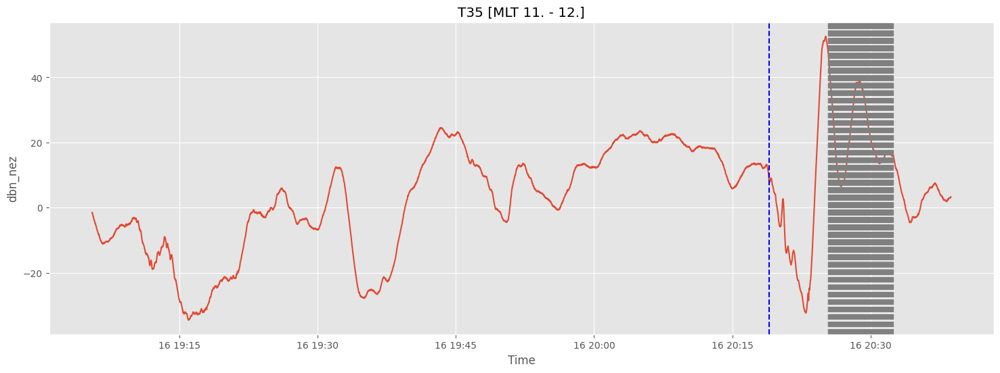

In [272]:
# plot significant amplitude changes
plt.figure(figsize=(18,6))
plt.plot(T35_df.index, T35_df.dbn_nez)

# detected amplitude changes
for chg in T35_df[significant_changes].index:
    plt.axvline(chg, label='changes in amplitude', color='gray', linestyle='dashed')

# events
for e in T35_df[T35_df.event==True].index:
    plt.axvline(e, label='+SI onset', color='blue', linestyle='dashed')

plt.ylabel('dbn_nez')
plt.xlabel('Time')
plt.title('T35 [MLT 11. - 12.]')
plt.show()

### locations of magnetometers

In [35]:
stats = {}

for s, lon, lat in zip(df.IAGA, df.GEOLON, df.GEOLAT):
    stats[s] = (lon, lat)

<Figure size 1800x600 with 0 Axes>

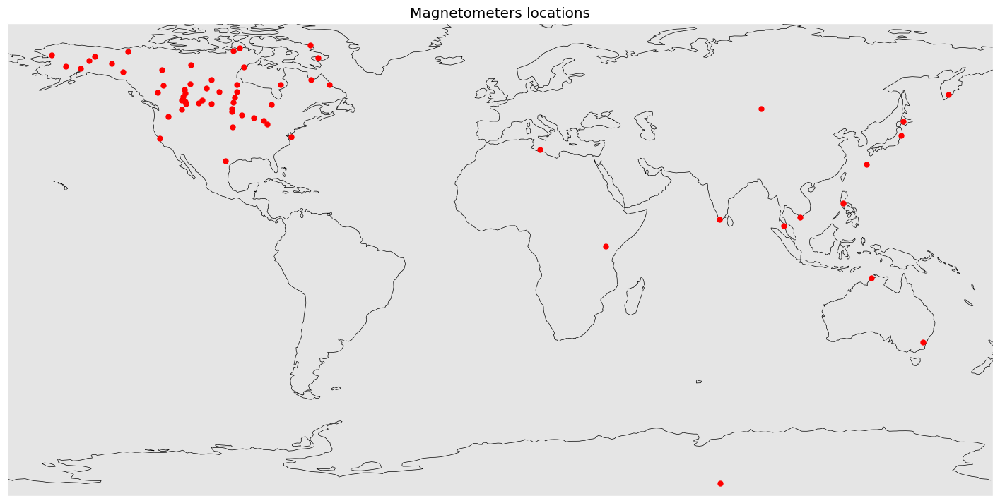

In [55]:
plt.figure(figsize=(18,6))

# map using PlateCarree projection (common for global maps)
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(18, 12))

# map
ax.coastlines()

# stations
for lon, lat in stats.values():
    ax.plot(lon, lat, 'ro', markersize=5, transform=ccrs.PlateCarree())

plt.title('Magnetometers locations')
plt.show()


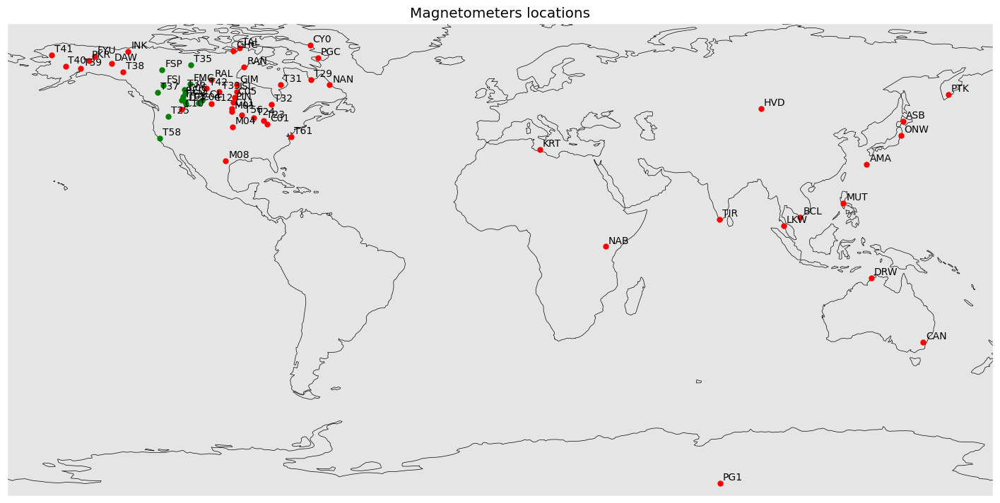

In [79]:
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(18, 12))

ax.coastlines()

for name, (lon, lat) in stats.items():
    if name in stations:
        ax.plot(lon, lat, 'go', markersize=5, transform=ccrs.PlateCarree())
    else:
        ax.plot(lon, lat, 'ro', markersize=5, transform=ccrs.PlateCarree())
    ax.text(lon + 1, lat + 1, name, transform=ccrs.PlateCarree())

plt.title('Magnetometers locations')
plt.show()

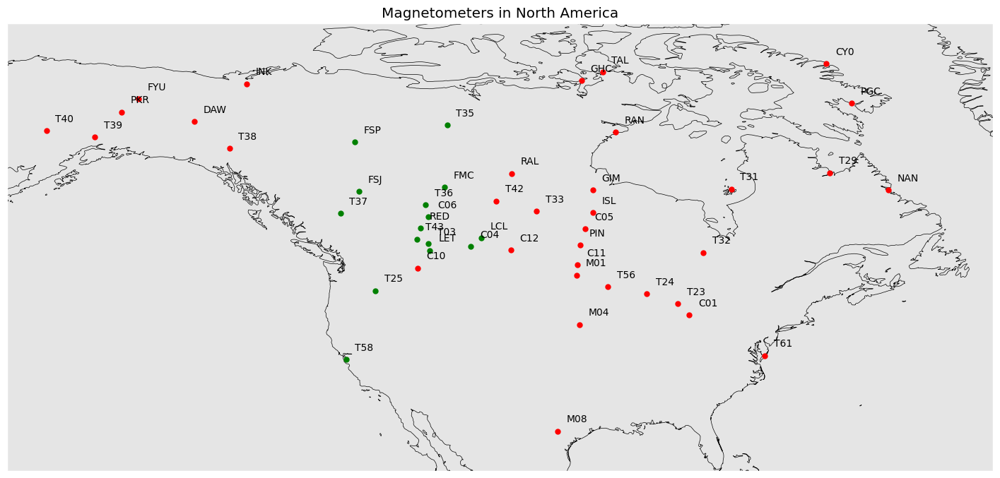

In [80]:
# Zoom on North America
# Filter points --> only show the stations in North America
na_bbox = (200, 310, 25, 75)
na_stats = {name: (lon, lat) for name, (lon, lat) in stats.items() if na_bbox[0] <= lon <= na_bbox[1] and na_bbox[2] <= lat <= na_bbox[3]}


# plot
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(18, 12))

ax.set_extent(na_bbox, crs=ccrs.PlateCarree())

ax.coastlines()

# magnetometers in North America
for name, (lon, lat) in na_stats.items():
    if name in stations:
        ax.plot(lon, lat, 'go', markersize=5, transform=ccrs.PlateCarree())
    else:
        ax.plot(lon, lat, 'ro', markersize=5, transform=ccrs.PlateCarree())
    ax.text(lon + 1, lat + 1, name, transform=ccrs.PlateCarree())

plt.title('Magnetometers in North America')
plt.show()